# 1

In [18]:

import numpy as np
import tensorflow as tf
from tensorflow import keras

# Generate some random data for demonstration
num_samples = 1000
num_features = 10
X = np.random.rand(num_samples, num_features)
y = np.random.randint(2, size=num_samples)

# Create a simple feedforward neural network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(num_features,)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X, y, epochs=10, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X, y)
print(f"Loss: {loss}, Accuracy: {accuracy}")


Epoch 1/10
32/32 [==============================] - 1s 2ms/step - loss: 0.6990 - accuracy: 0.4800
Epoch 2/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6945 - accuracy: 0.4980
Epoch 3/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6917 - accuracy: 0.5240
Epoch 4/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6897 - accuracy: 0.5370
Epoch 5/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6888 - accuracy: 0.5380
Epoch 6/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6889 - accuracy: 0.5360
Epoch 7/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6873 - accuracy: 0.5280
Epoch 8/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6860 - accuracy: 0.5630
Epoch 9/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.5460
Epoch 10/10
32/32 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.5940
Loss: 0.68093115091

# 2

Epoch 1/20
1/1 [==============================] - 4s 4s/step - loss: 0.1400 - accuracy: 1.0000
Epoch 2/20
1/1 [==============================] - 1s 794ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - 1s 768ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - 1s 739ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 5/20
1/1 [==============================] - 1s 758ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 6/20
1/1 [==============================] - 1s 699ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 7/20
1/1 [==============================] - 1s 744ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 8/20
1/1 [==============================] - 1s 760ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 9/20
1/1 [==============================] - 1s 741ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Epoch 10/20
1/1 [==============================] - 1s 720ms/step - loss: 0.0000e+00 - acc

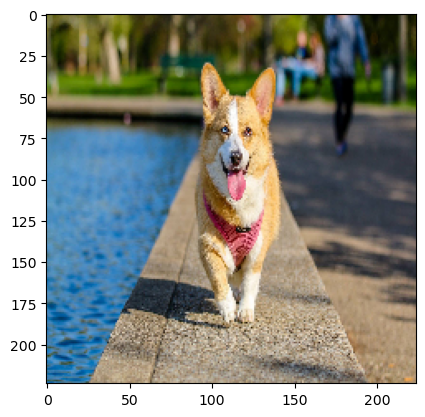

Predicted Class: 1
Dog


In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load and preprocess the single image
img_path = 'dog.jpg'
img = load_img(img_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Create VGG16 model
base_model = VGG16(include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
preds = Dense(1, activation='sigmoid')(x)  # Binary classification, so 1 output node with sigmoid activation

# Create and compile the model
model = Model(inputs=base_model.input, outputs=preds)
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model (in this case, on a single image, as we don't have a dataset)
model.fit(img_array, np.array([1]), epochs=20, batch_size=1)

# Making prediction
prediction = model.predict(img_array)
predicted_class = int(round(prediction[0][0]))

# Display the image and prediction
plt.imshow(img)
plt.show()

print("Predicted Class:", predicted_class)
if(predicted_class==1):
    print('Dog')
else:
    print("Cat")


# 3

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM

# Load and preprocess the stock data
stock_data = pd.read_csv('goog.csv')
stock_data = stock_data[['date', 'open', 'close']]
stock_data['date'] = pd.to_datetime(stock_data['date'].apply(lambda x: x.split()[0]))
stock_data.set_index('date', drop=True, inplace=True)

# Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
normalized_stock_data = scaler.fit_transform(stock_data)

# Split the data into training and testing sets
training_size = round(len(normalized_stock_data) * 0.80)
train_data = normalized_stock_data[:training_size]
test_data = normalized_stock_data[training_size:]

# Function to create sequences for LSTM
def create_sequences(dataset, sequence_length=50):
    sequences, labels = [], []
    start_idx = 0
    for stop_idx in range(sequence_length, len(dataset)):
        sequences.append(dataset[start_idx:stop_idx])
        labels.append(dataset[stop_idx])
        start_idx += 1
    return np.array(sequences), np.array(labels)

# Create sequences for training and testing
sequence_length = 50
train_sequences, train_labels = create_sequences(train_data, sequence_length)
test_sequences, test_labels = create_sequences(test_data, sequence_length)

# Build LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(sequence_length, train_sequences.shape[2])))
model.add(Dropout(0.1))
model.add(LSTM(units=50))
model.add(Dense(train_labels.shape[1]))  # Assuming the number of features is the same as the output size
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])
model.summary()

# Train the model
epochs = 80
batch_size = 32
validation_data = (test_sequences, test_labels)
history = model.fit(train_sequences, train_labels, epochs=epochs, batch_size=batch_size, validation_data=validation_data, verbose=1)

# Predict using the trained model
test_predictions = model.predict(test_sequences)
test_predictions[:5]


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50, 50)            10600     
                                                                 
 dropout (Dropout)           (None, 50, 50)            0         
                                                                 
 lstm_1 (LSTM)               (None, 50)                20200     
                                                                 
 dense_11 (Dense)            (None, 2)                 102       
                                                                 
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Epoch 1/80
30/30 [==============================] - 6s 86ms/step - loss: 0.0070 - mean_absolute_error: 0.0614 - val_loss: 0.0101 - val_mean_absolute_error: 0.0842
Epoch 2/80
30/30 [=

array([[0.4760673 , 0.47800982],
       [0.4814526 , 0.48331589],
       [0.4869464 , 0.48862386],
       [0.5032136 , 0.5045238 ],
       [0.5114046 , 0.5128279 ]], dtype=float32)

# 5

In [4]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.layers import Input, Embedding, GRU, Dense
from keras.models import Model
from keras.callbacks import EarlyStopping

# Load the data
df = pd.read_csv("bollywood_box_clean.csv")
df

x = df[["movie_opening","movie_weekend","movie_firstweek"]]
y = df["movie_total_worldwide"]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


In [14]:
input_shape = (x_train.shape[1], 1)
input_layer = Input(shape=input_shape)
gru_layer = GRU(64, return_sequences=True)(input_layer)
gru_layer = GRU(32, return_sequences=True)(gru_layer)
gru_layer = GRU(16)(gru_layer)
output_layer = Dense(1, activation='linear')(gru_layer)
model = Model(input_layer, output_layer)
model.compile(loss='mean_squared_error', optimizer='adam', 
metrics=['mean_absolute_error'])

In [15]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5)
model.fit(x_train, y_train, epochs=5, batch_size=32, validation_data=(x_test, 
y_test), callbacks=[early_stopping])
test_loss = model.evaluate(x_test, y_test)
print(f'Test loss: {test_loss}')

Epoch 1/5
4/4 [==============================] - 8s 291ms/step - loss: 27918.9883 - mean_absolute_error: 104.3874 - val_loss: 34607.7773 - val_mean_absolute_error: 121.9765
Epoch 2/5
4/4 [==============================] - 0s 19ms/step - loss: 27768.9492 - mean_absolute_error: 103.8651 - val_loss: 34444.5391 - val_mean_absolute_error: 121.5874
Epoch 3/5
4/4 [==============================] - 0s 17ms/step - loss: 27665.9453 - mean_absolute_error: 103.4490 - val_loss: 34292.5703 - val_mean_absolute_error: 121.2267
Epoch 4/5
4/4 [==============================] - 0s 18ms/step - loss: 27597.5137 - mean_absolute_error: 103.1220 - val_loss: 34153.9141 - val_mean_absolute_error: 120.8988
Epoch 5/5
1/1 [==============================] - 0s 26ms/step - loss: 34027.2578 - mean_absolute_error: 120.6029
Test loss: [34027.2578125, 120.60291290283203]


In [16]:
y_pred = model.predict([[171.50 ,123,234]])

1/1 [==============================] - 1s 1s/step


# 8

In [30]:
import tensorflow as tf
import cv2
import tensorflow_hub as hub
import numpy as np
from PIL import Image

#tensor to image
def load_img(path_to_img):
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = img[tf.newaxis, :]
    return img

# Loading dataset
content_path = "dog.jpg"
style_path = "style.jpeg"
dog_image = load_img(content_path)
style_image = load_img(style_path)
dog = cv2.imread(content_path)
style = cv2.imread(style_path)



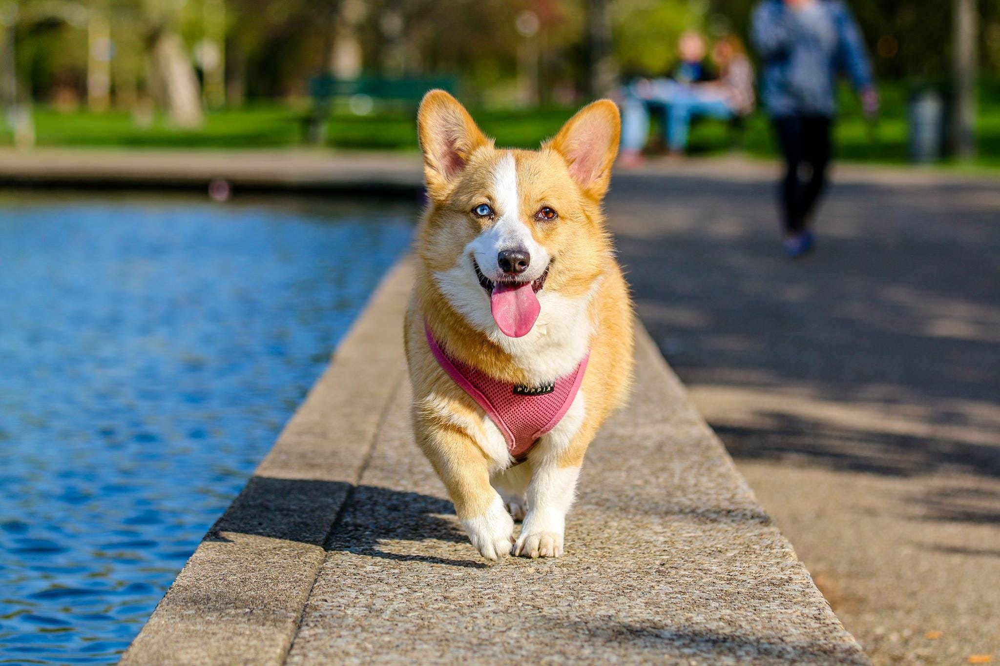

In [31]:
# Visualizing images
Image.fromarray(cv2.cvtColor(dog,cv2.COLOR_BGR2RGB))

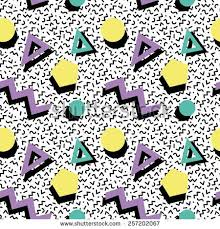

In [32]:
Image.fromarray(cv2.cvtColor(style, cv2.COLOR_BGR2RGB))

In [33]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
    tensor = tensor[0]
    return Image.fromarray(tensor)

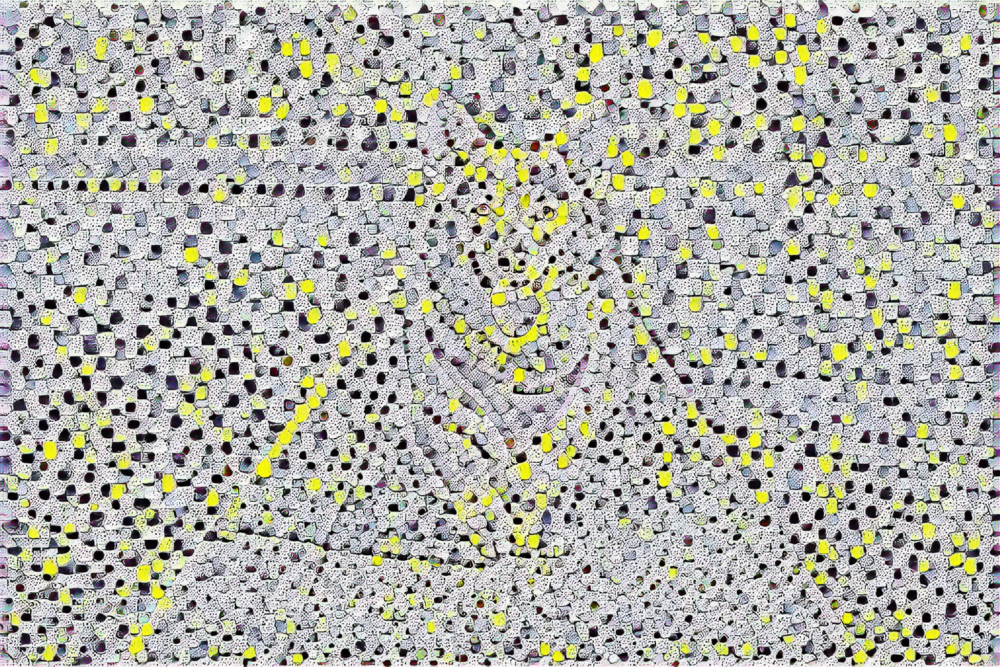

In [34]:
#performing style transfer
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(dog_image), tf.constant(style_image))[0]
op = tensor_to_image(stylized_image)
op

# 10

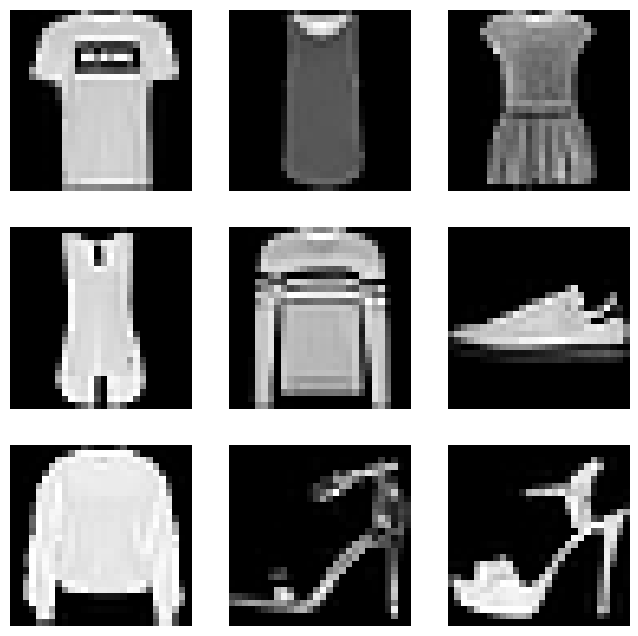

1875/1875 [==============================] - 23s 12ms/step - loss: 0.4739 - accuracy: 0.8277
313/313 - 1s - loss: 0.3950 - accuracy: 0.8580 - 999ms/epoch - 3ms/step

Test accuracy: 0.8579999804496765
313/313 [==============================] - 1s 3ms/step


array([[2.3520597e-06, 5.6199275e-07, 3.2124768e-07, ..., 1.2153931e-02,
        4.8771661e-04, 9.8391563e-01],
       [3.3572700e-04, 2.6058036e-09, 9.9922693e-01, ..., 5.3331866e-12,
        1.2847376e-07, 1.0409416e-08],
       [2.3732555e-06, 9.9998784e-01, 4.1592884e-07, ..., 2.3865482e-10,
        6.1012793e-06, 1.9921325e-09],
       ...,
       [7.5954003e-03, 1.1705745e-07, 6.8685471e-04, ..., 1.3646337e-06,
        9.8936707e-01, 2.6656247e-07],
       [5.5142101e-07, 9.9978858e-01, 1.4097024e-07, ..., 1.1952847e-07,
        5.2872696e-05, 1.1994406e-06],
       [6.5816767e-03, 7.1492803e-05, 2.8527728e-03, ..., 3.1044385e-01,
        9.2626713e-02, 3.8703473e-03]], dtype=float32)

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers

# Load the Fashion MNIST dataset
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

# Pre-process and normalize the data
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

# Display a sample of images from the dataset
plt.figure(figsize=(8, 8))
for i in range(1, 10):
    plt.subplot(3, 3, i)
    plt.imshow(x_train[i], cmap=plt.get_cmap('gray'))
    plt.axis('off')  # Turn off axis labels for better visualization
plt.show()

# Build the Convolutional Neural Network (CNN) model
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(x_train.reshape(-1, 28, 28, 1), y_train, epochs=1)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test.reshape(-1, 28, 28, 1), y_test, verbose=2)
print('\nTest accuracy:', test_acc)

# Make predictions on the test set
preds = model.predict(x_test.reshape(-1, 28, 28, 1))

preds